In [10]:
import pandas as pd
import numpy as np
import math
from matplotlib import pyplot as plt
import seaborn as sns
log_dir = 'C:/Users/user/rally_project/data/Rally_style/log/'
pcsv_dir = 'C:/Users/user/rally_project/data/Rally_style/CSV_preprocessed/'
filename = 'project2_data.csv'
df = pd.read_csv(pcsv_dir + filename)
df = df.drop('Unnamed: 0',axis=1)
df.head(10)

C:\Users\user\AppData\Local\Temp\ipykernel_16500\3847855254.py:9: DtypeWarning: Columns (58,61,67,70,72) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(pcsv_dir + filename)


,Time(s),Lap(s),Distance(m),Complete%,X,Y,Z,speed(km/h),X vel,Y vel,...,current_pacenote_next_direction,current_pacenote_length,current_pacenote_width,current_pacenote_caution,current_pacenote_continue,pace_time(s),Delta steering,Delta throttle,Delta brake,Delta clutch
0,28.567856,2.416570,15.800781,0.003607,-1600.159546,483.638428,2995.896484,52.661560,13.158561,0.122939,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,-35.999640,0.0,60.002400
1,28.584576,2.433236,16.045563,0.003663,-1599.939941,483.640472,2995.789795,52.728127,13.173642,0.123346,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,-35.999640,0.0,60.002400
2,28.601223,2.449902,16.289108,0.003718,-1599.720459,483.642334,2995.683105,52.714771,13.168942,0.112298,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,0.000000
3,28.617910,2.466568,16.533379,0.003774,-1599.501099,483.644043,2995.576416,52.701351,13.164785,0.101706,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,0.000000
4,28.634604,2.483234,16.777603,0.003830,-1599.281738,483.645752,2995.469727,52.686554,13.159909,0.103074,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,0.000000
5,28.651329,2.499900,17.022602,0.003886,-1599.062134,483.647705,2995.362793,52.747002,13.172989,0.117199,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,-5.986199
6,28.667988,2.516566,17.267204,0.003942,-1598.841919,483.649689,2995.255371,52.916794,13.213669,0.118117,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,-5.986199
7,28.684637,2.533232,17.512821,0.003998,-1598.620483,483.651611,2995.147461,53.204967,13.284941,0.114663,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,0.000000,0.0,-5.986199
8,28.701307,2.549898,17.760635,0.004054,-1598.397461,483.653503,2995.038818,53.603909,13.384657,0.113394,...,right,NaN,NaN,NaN,NaN,2.57,0.00864,13.255670,0.0,-5.986199
9,28.717999,2.566564,18.010727,0.004111,-1598.172485,483.655457,2994.929199,54.064785,13.499905,0.117102,...,right,NaN,NaN,NaN,NaN,2.57,0.00000,13.333913,0.0,-5.986199


(array([13085.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,  4689.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

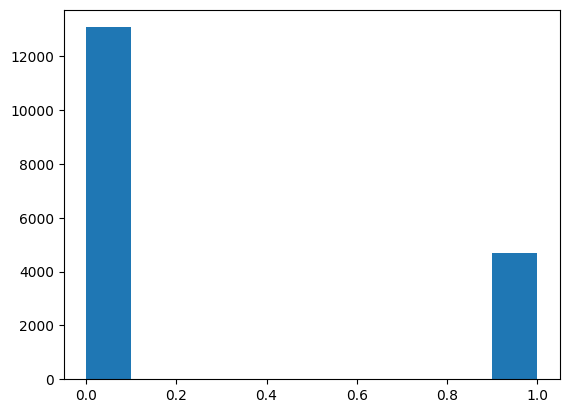

In [11]:
## 바퀴 양쪽이 앞 뒤 각각 크게 임발란스 할 경우 슬립으로 판정.
F_imb = (df['slipFR']-df['slipFL']).abs()>2.5
R_imb = (df['slipRR']-df['slipRL']).abs()>2.5
ndf = df.copy()
ndf['Slip issue'] = F_imb | R_imb
ndf.loc[ndf['Slip issue']==True,'Slip issue'] = 1
ndf.loc[ndf['Slip issue']==False,'Slip issue'] = 0
plt.hist((ndf['Slip issue']))

In [31]:
new_ndf1 = ndf.drop(['slipFR','slipFL','slipRR','slipRL',
                     'LastLap(s)','Vehicle_tyre','Vehicle_tyre_performance','Vehicle_tyre_durability']
                     ,axis=1)

## 결측치 처리
new_ndf1 = new_ndf1.fillna('null')
idx = (new_ndf1.dtypes!=float)


C:\Users\user\AppData\Local\Temp\ipykernel_16500\3887760479.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ndf.loc[ndf['Slip issue']==0, col_name], label= 'Proper silp' , color= 'b')
C:\Users\user\AppData\Local\Temp\ipykernel_16500\3887760479.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distp

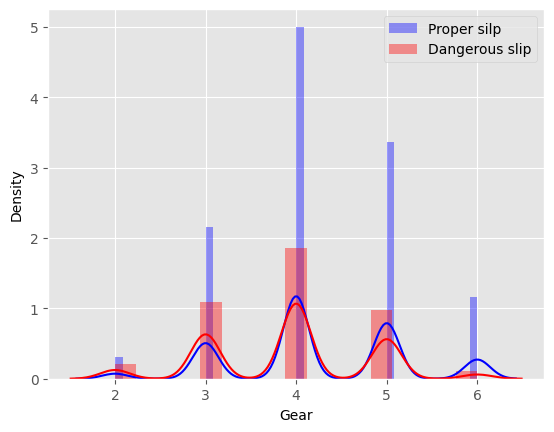

In [29]:
# fig_dir = 'C:/Users/user/rally_project/data/Analysis/Figure/project2/'
# col_name = ''
# # fig_name = 'speed'
# plt.style.use('ggplot')
# sns.distplot(ndf.loc[ndf['Slip issue']==0, col_name], label= 'Proper silp' , color= 'b')
# sns.distplot(ndf.loc[ndf['Slip issue']==1, col_name], label = 'Dangerous slip',  color= 'r')
# plt.legend()
# plt.show()
# # sns.savefig(fig_dir+fig_name)

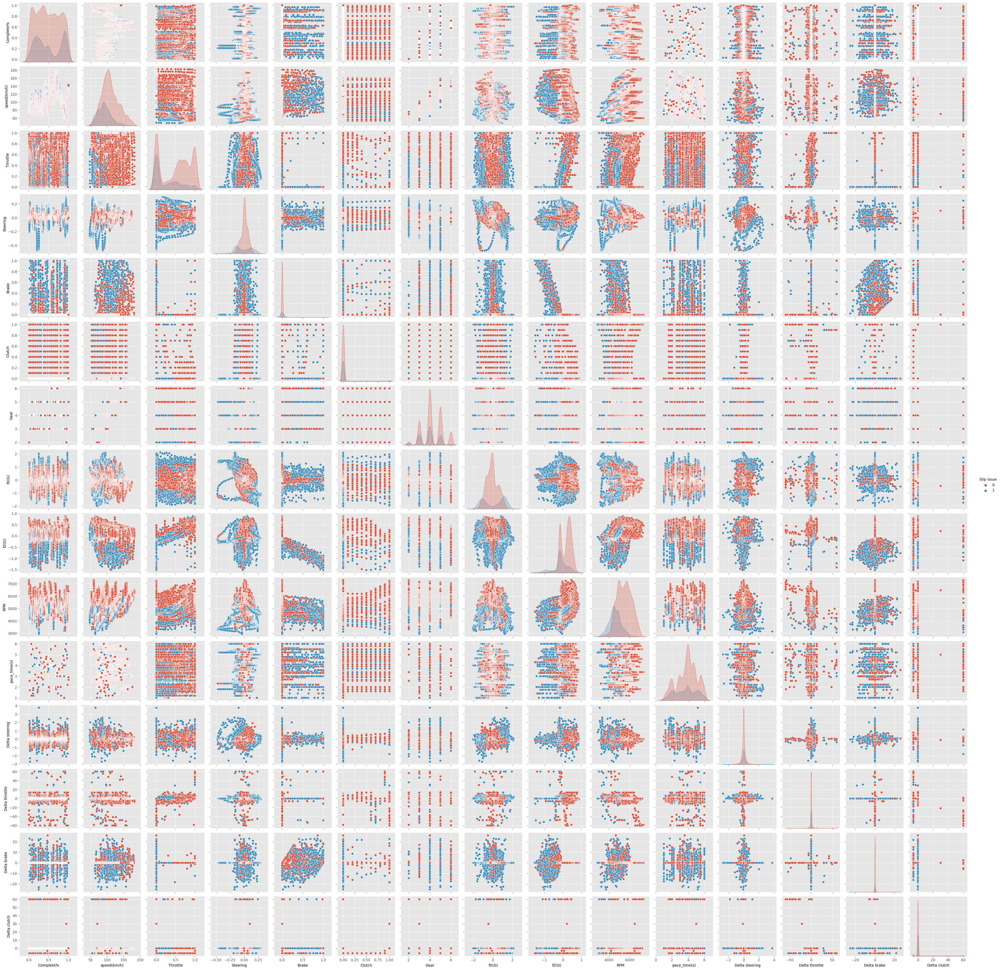

In [32]:
col_lst = [
     'Complete%', 
       'speed(km/h)','Throttle', 'Steering',
       'Brake', 'Clutch', 'Gear', 'fX(G)', 'fZ(G)', 'RPM','pace_time(s)', 'Delta steering',
       'Delta throttle', 'Delta brake', 'Delta clutch', 'Slip issue'
]
sns.pairplot(new_ndf1[col_lst],hue = 'Slip issue')